# 使用V1版本回测

In [1]:
import sys
sys.path.append("../")
from utils.RollingLoadratePrice_utils_V1 import *

# 1) 处理市场数据
market_data = pd.read_parquet("../data/processed/shanxi_new.parquet",engine='fastparquet')
market_data = process_market_data(market_data, date_begin="2025-01-01", date_end="2025-08-05")
pred_csv_path="../save/curve_classify/multi_GRU_predict_results_V2.csv"
truth_csv_path="../data/processed/hiking_01_dataset.csv"
date_begin="2025-07-21" 
date_end="2025-08-05"

# 2) 直接从两个CSV构建curves_record
curves_record_match = build_curves_record_with_history_classify_from_csv(
    market_data=market_data,
    date_begin=date_begin,
    date_end=date_end,
    d=5,
    pred_csv_path=pred_csv_path,  
    truth_csv_path=truth_csv_path,            
    selection="match",   # 或 'baseline' / 'pos_only' / 'neg_only'
)

curves_record_baseline = build_curves_record_with_history_classify_from_csv(
    market_data=market_data,
    date_begin=date_begin,
    date_end=date_end,
    d=5,
    pred_csv_path=pred_csv_path,  
    truth_csv_path=truth_csv_path,            
    selection="baseline",   # 或 'baseline' / 'pos_only' / 'neg_only'
)


# 3) 查看CSV中哪些是预测错的、哪些是预测对的
correct, wrong = split_correct_wrong_by_csv(
    csv_path=pred_csv_path,
    date_begin=date_begin,
    date_end=date_end,
)


Index(['price', '实时价格', '实时在线机组容量(MW)', '实时负荷率(%)', '非市场化机组出力-日内(MW)',
       '联络线计划-日内(MW)', '竞价空间-日内(MW)', '频率实际值(MW)', '实际上旋备用(MW)', '实际下旋备用(MW)',
       '省调负荷-日内(MW)', '新能源负荷-日内(MW)', '实时风电(MW)', '实时光伏(MW)', '水电出力值-日内(MW)',
       '日前在线机组容量(MW)', '日前负荷率(%)', '非市场化机组出力-日前(MW)', '联络线计划-日前(MW)',
       '竞价空间-日前(MW)', '省调负荷-日前(MW)', '新能源负荷-日前(MW)', '正备用-日前(MW)',
       '新能源负荷备用-日前(MW)', '日前光伏(MW)', '日前风电(MW)'],
      dtype='object')


预测正确： ['2025-07-21', '2025-07-22', '2025-07-23', '2025-07-24', '2025-07-25', '2025-07-27', '2025-07-28', '2025-07-29', '2025-07-30', '2025-07-31', '2025-08-01', '2025-08-02']
预测错误： ['2025-07-26', '2025-08-03', '2025-08-04', '2025-08-05']


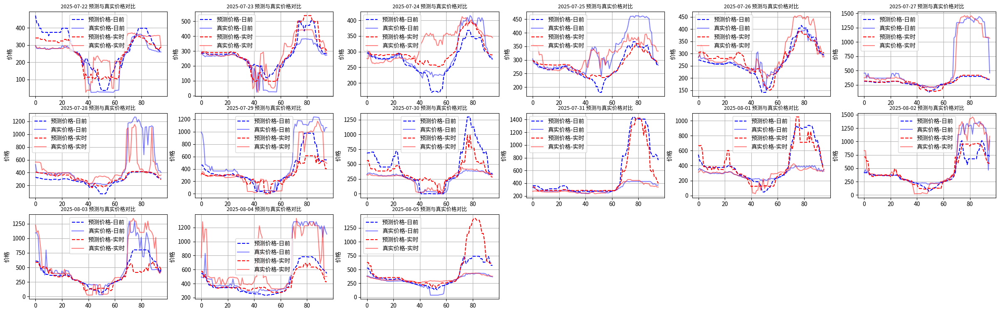

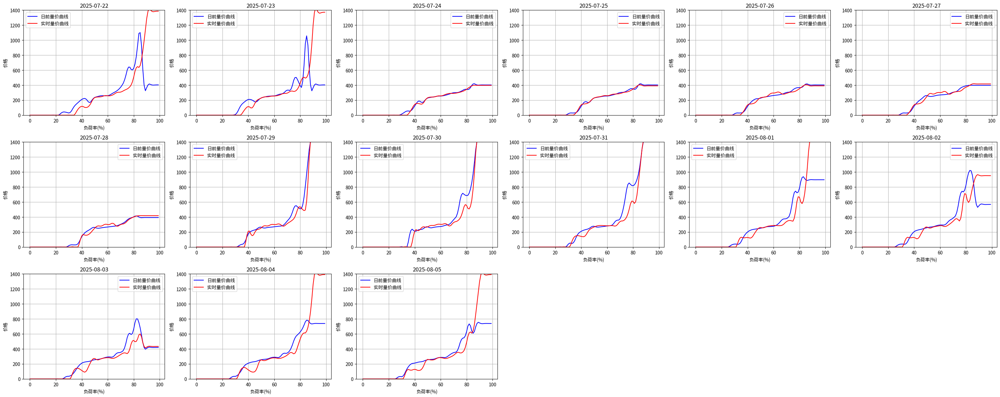

In [2]:
print("预测正确：", correct)
print("预测错误：", wrong)

plot_compare_predict_vs_true(curves_record_baseline)
plot_loadrate_price_curves(curves_record_baseline)

预测正确： ['2025-07-21', '2025-07-22', '2025-07-23', '2025-07-24', '2025-07-25', '2025-07-27', '2025-07-28', '2025-07-29', '2025-07-30', '2025-07-31', '2025-08-01', '2025-08-02']
预测错误： ['2025-07-26', '2025-08-03', '2025-08-04', '2025-08-05']


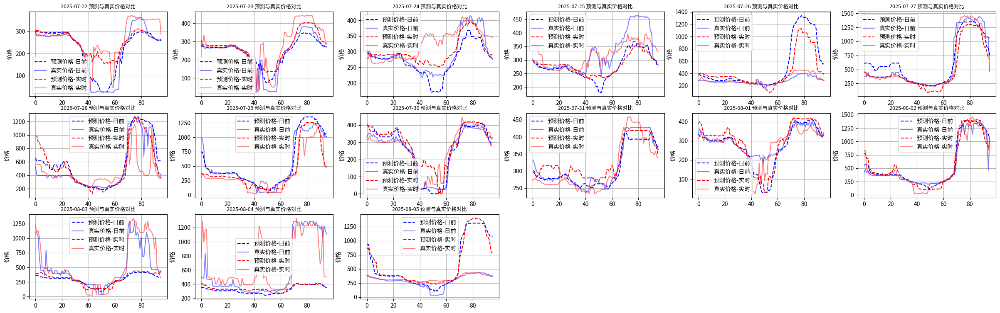

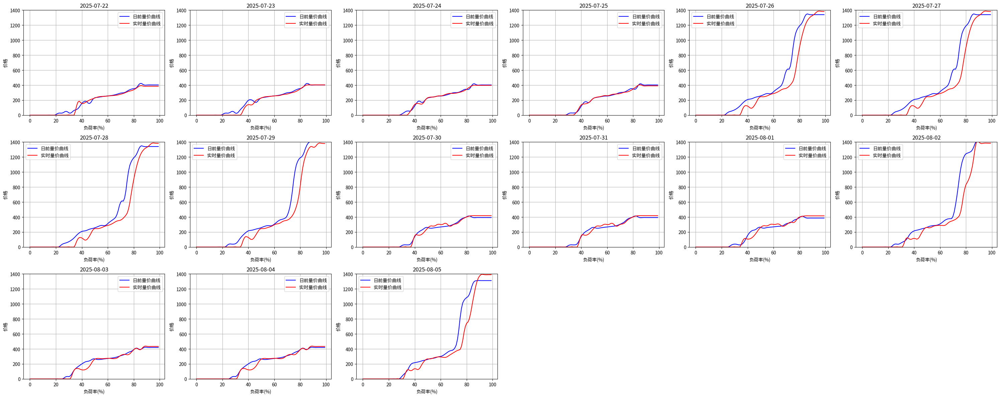

In [3]:
print("预测正确：", correct)
print("预测错误：", wrong)

plot_compare_predict_vs_true(curves_record_match)
plot_loadrate_price_curves(curves_record_match)

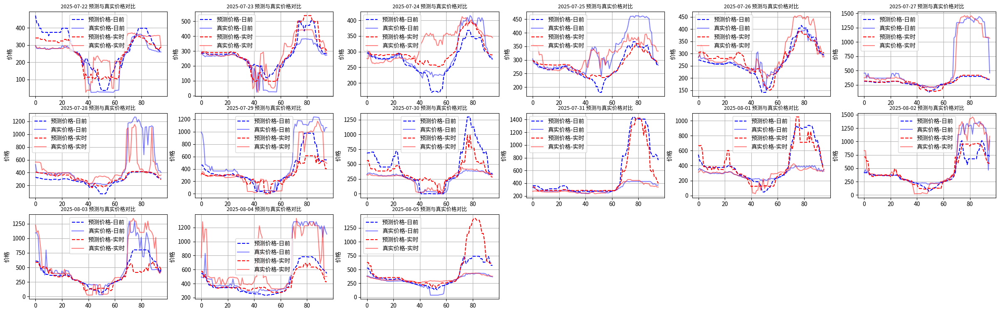

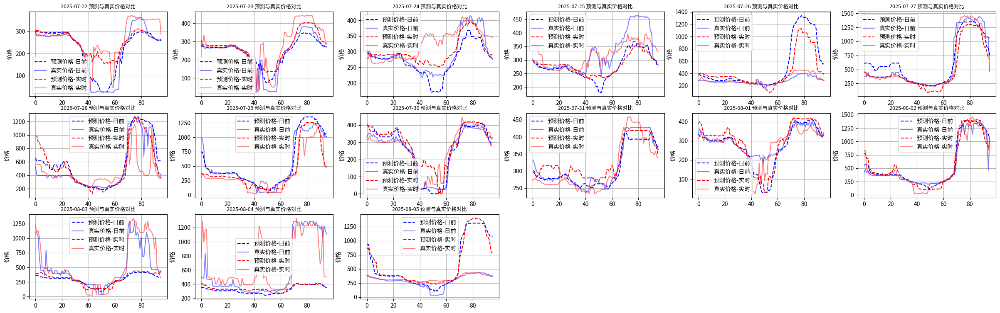

In [4]:
plot_compare_predict_vs_true(curves_record_baseline)
plot_compare_predict_vs_true(curves_record_match)

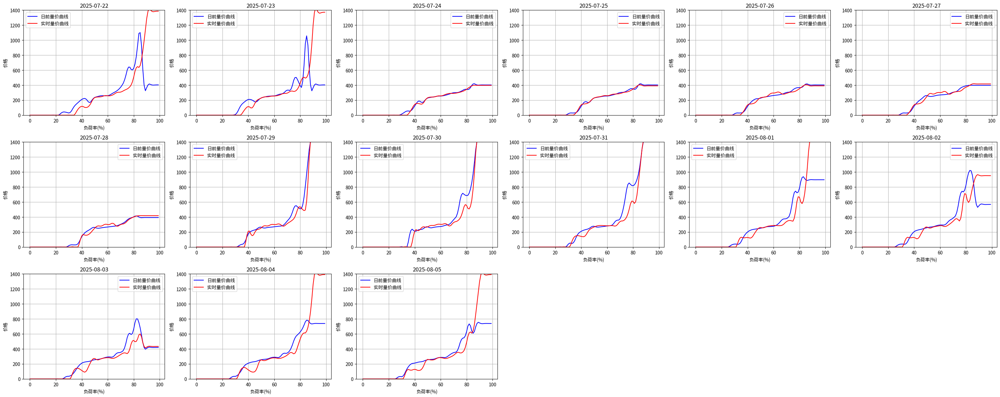

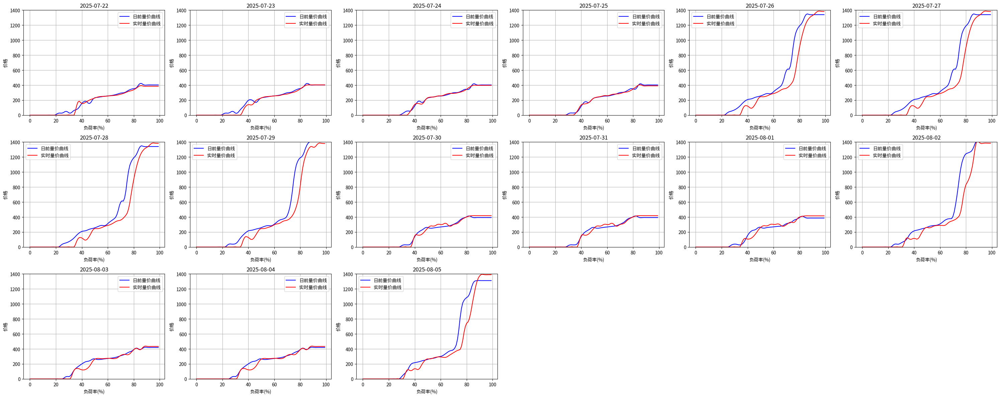

In [5]:
plot_loadrate_price_curves(curves_record_baseline)
plot_loadrate_price_curves(curves_record_match)

# 使用V2版本回测

In [6]:
# V2版本和V1版本是等价的，这里只是为了使用V2版本兼容性的“回测”接口

Index(['price', '实时价格', '实时在线机组容量(MW)', '实时负荷率(%)', '非市场化机组出力-日内(MW)',
       '联络线计划-日内(MW)', '竞价空间-日内(MW)', '频率实际值(MW)', '实际上旋备用(MW)', '实际下旋备用(MW)',
       '省调负荷-日内(MW)', '新能源负荷-日内(MW)', '实时风电(MW)', '实时光伏(MW)', '水电出力值-日内(MW)',
       '日前在线机组容量(MW)', '日前负荷率(%)', '非市场化机组出力-日前(MW)', '联络线计划-日前(MW)',
       '竞价空间-日前(MW)', '省调负荷-日前(MW)', '新能源负荷-日前(MW)', '正备用-日前(MW)',
       '新能源负荷备用-日前(MW)', '日前光伏(MW)', '日前风电(MW)'],
      dtype='object')


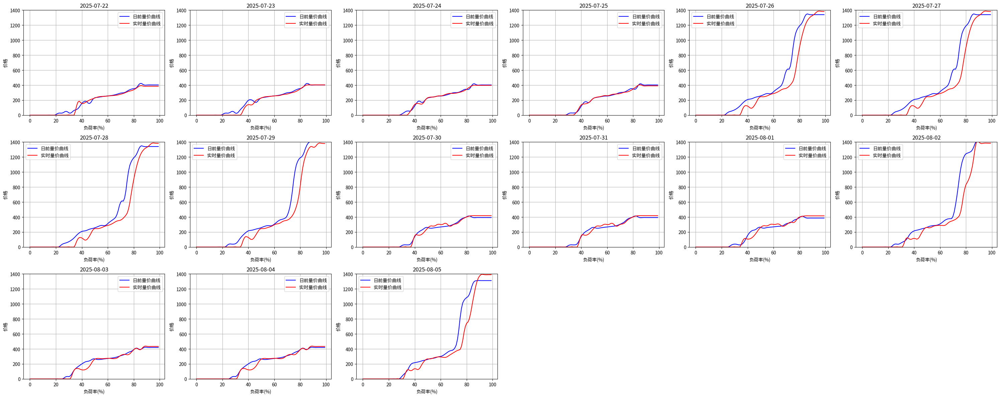

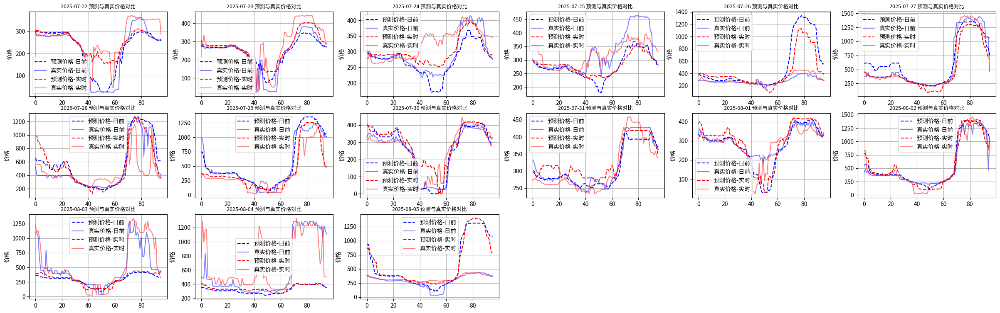

In [7]:
import sys
sys.path.append("../")
from utils.RollingLoadratePrice_utils_V2 import (
    process_market_data,
    build_curves_record_with_history_from_csv,   # 统一入口
    plot_static_curves_unified,                  # 可选：统一画图
    plot_price_timeseries_unified,               # 可选：统一画图
)
from utils.RollingLoadratePrice_utils_V1 import split_correct_wrong_by_csv

# 1) 处理市场数据
market_data = pd.read_parquet("../data/processed/shanxi_new.parquet",engine='fastparquet')
market_data = process_market_data(market_data, date_begin="2025-01-01", date_end="2025-08-05")
pred_csv_path="../save/curve_classify/multi_GRU_predict_results_V2.csv"
truth_csv_path="../data/processed/hiking_01_dataset.csv"
date_begin="2025-07-21" 
date_end="2025-08-05"

# 2) 统一接口（明确指定 backtest + loadrate）
curves_record_match = build_curves_record_with_history_from_csv(
    market_data=market_data,
    date_begin=date_begin,
    date_end=date_end,
    d=5,
    pattern="backtest",     # ← 明确：回测
    x_mode="loadrate",      # ← 明确：负荷率
    pred_csv_path=pred_csv_path,
    truth_csv_path=truth_csv_path,
    selection="match",
)

curves_record_baseline = build_curves_record_with_history_from_csv(
    market_data=market_data,
    date_begin=date_begin,
    date_end=date_end,
    d=5,
    pattern="backtest",
    x_mode="loadrate",
    # baseline 不需要 pred/truth，可直接省略
    selection="baseline",
)

# 3) 对错拆分依旧可用
correct, wrong = split_correct_wrong_by_csv(
    csv_path=pred_csv_path,
    date_begin=date_begin,
    date_end=date_end,
)

# 4)（可选）画图也可以走统一入口
# 多天回测 → 多子图
plot_static_curves_unified(curves_record_match, pattern="backtest", x_mode="loadrate")
plot_price_timeseries_unified(curves_record_match, pattern="backtest")


# 每月回测D+1

Index(['price', '实时价格', '实时在线机组容量(MW)', '实时负荷率(%)', '非市场化机组出力-日内(MW)',
       '联络线计划-日内(MW)', '竞价空间-日内(MW)', '频率实际值(MW)', '实际上旋备用(MW)', '实际下旋备用(MW)',
       '省调负荷-日内(MW)', '新能源负荷-日内(MW)', '实时风电(MW)', '实时光伏(MW)', '水电出力值-日内(MW)',
       '日前在线机组容量(MW)', '日前负荷率(%)', '非市场化机组出力-日前(MW)', '联络线计划-日前(MW)',
       '竞价空间-日前(MW)', '省调负荷-日前(MW)', '新能源负荷-日前(MW)', '正备用-日前(MW)',
       '新能源负荷备用-日前(MW)', '日前光伏(MW)', '日前风电(MW)'],
      dtype='object')
评估区间：2025-03-01 ~ 2025-07-31（按数据自动取交集）

=== 月度准确率（DA）===
selection   baseline  diffusion   match   delta
month                                          
2025-03-01    0.6800     0.7455  0.7938  0.1138
2025-04-01    0.6596     0.6952  0.7984  0.1388
2025-05-01    0.6300     0.7411  0.7831  0.1531
2025-06-01    0.7044     0.7269  0.6894 -0.0150
2025-07-01    0.6163     0.7935  0.7898  0.1736

=== 月度准确率（RT）===
selection   baseline   match   delta
month                               
2025-03-01    0.5998  0.7446  0.1447
2025-04-01    0.6155  0.7411  0.1255
2025

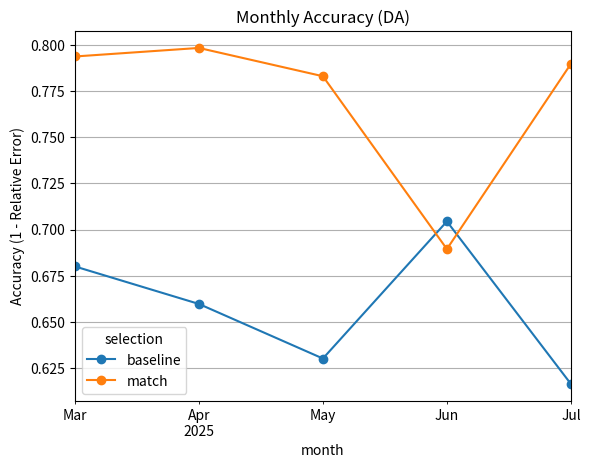

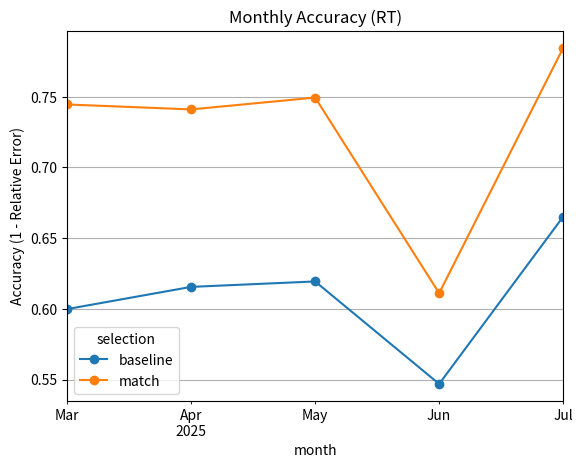

In [11]:
# === 0) 路径与区间 ===
import pandas as pd
import numpy as np

import sys
sys.path.append("../")  # 确保 utils 在路径中

from utils.RollingLoadratePrice_utils_V1 import (
    process_market_data,
    build_curves_record_with_history_classify_from_csv,
    load_pred_series_from_csv,         # 仅用来拿到可用日期范围
)

# 数据路径（按你的目录）
parquet_path = "../data/processed/shanxi_new.parquet"
pred_csv_path = "../save/curve_classify/multi_GRU_predict_results_V2.csv"
truth_csv_path = "../data/processed/hiking_01_dataset.csv"   # selection='match' 需要

# >>> 新增(Diffusion)：分布CSV（含 p50 列）
dist_csv_path = "../data/price_pred_da/da_dist_1.csv"  # 改成你的实际路径


# 评估区间（建议取“市场数据 ∩ 预测CSV”交集）
date_begin = "2025-03-01"
date_end   = "2025-07-31"

# 量价曲线历史天数 d
d = 5

# === 1) 读数据 & 预处理 ===
mdf_raw = pd.read_parquet(parquet_path, engine="fastparquet")
market_data = process_market_data(mdf_raw.copy(), date_begin=date_begin, date_end=date_end)

# 为了安全，取与预测CSV的交集（按天）
pred_days = load_pred_series_from_csv(pred_csv_path).index
avail_days = pd.to_datetime(market_data.index.normalize().unique())
lo = max(pd.to_datetime(date_begin), pred_days.min(), avail_days.min())
hi = min(pd.to_datetime(date_end),   pred_days.max(), avail_days.max())
date_begin_eval = lo.strftime("%Y-%m-%d")
date_end_eval   = hi.strftime("%Y-%m-%d")

# >>> 新增(Diffusion)：读取 diffusion 的 p50，并裁到评估区间
dist_df = pd.read_csv(dist_csv_path)
dist_df["time"] = pd.to_datetime(dist_df["time"]).dt.tz_localize(None)
dist_df = dist_df[
    (dist_df["time"] >= pd.to_datetime(date_begin_eval)) &
    (dist_df["time"] <= pd.to_datetime(date_end_eval) + pd.Timedelta(minutes=45))
]

# >>> 新增(Diffusion)：将 market_data 转成含 'time' 列，取 DA 真值（price）
md_for_join = market_data.reset_index().rename(columns={"index": "time"}) \
    if "time" not in market_data.columns else market_data.copy()
truth_da = md_for_join[["time", "price"]].copy()

print(f"评估区间：{date_begin_eval} ~ {date_end_eval}（按数据自动取交集）")

# === 2) 构建两套 curves_record（baseline vs match） ===
# >>> 新增(Diffusion)：把 (真值price, p50) 组装成 curves_record（仅 DA）
def build_curves_record_diffusion_da(truth_df: pd.DataFrame,
                                     dist_df: pd.DataFrame,
                                     date_begin: str,
                                     date_end: str) -> dict:
    df = (truth_df.merge(dist_df[["time", "p50"]], on="time", how="inner")
                  .sort_values("time"))
    df = df[
        (df["time"] >= pd.to_datetime(date_begin)) &
        (df["time"] <= pd.to_datetime(date_end) + pd.Timedelta(minutes=45))
    ]
    df["date"] = df["time"].dt.date

    out = {}
    for d_, g in df.groupby("date"):
        out[pd.to_datetime(d_).strftime("%Y-%m-%d")] = {
            "price_da": g["price"].to_numpy(dtype=float),
            "price_pred_da": g["p50"].to_numpy(dtype=float),
            # 注意：没有 RT，因此不放 rt 相关键
        }
    return out

def build_curves(selection: str):
    return build_curves_record_with_history_classify_from_csv(
        market_data=market_data,
        date_begin=date_begin_eval,
        date_end=date_end_eval,
        d=d,
        pred_csv_path=pred_csv_path,
        truth_csv_path=(truth_csv_path if selection != "baseline" else None),
        selection=selection,
    )

curves_baseline = build_curves("baseline")
curves_match    = build_curves("match")
# >>> 新增(Diffusion)：构建 diffusion 的 curves_record（仅 DA）
curves_diffusion = build_curves_record_diffusion_da(
    truth_da, dist_df, date_begin_eval, date_end_eval
)

# === 3) 将 curves_record -> 每日指标（DA/RT 分开算） ===
def _safe_daily_metrics(curves_record: dict, kind: str) -> pd.DataFrame:
    """
    kind in {'da','rt'}
    产出列：date, kind, mae, mean_true, rel_err, accuracy
    """
    rows = []
    for dstr, c in curves_record.items():
        true = np.asarray(c["price_da"] if kind=="da" else c["price_rt"], dtype=float)
        pred_s = c["price_pred_da"] if kind=="da" else c["price_pred_rt"]
        pred = np.asarray(getattr(pred_s, "values", pred_s), dtype=float)

        # 长度对齐 + NaN 掩码
        n = min(len(true), len(pred))
        if n == 0: 
            continue
        true = true[:n]; pred = pred[:n]
        mask = np.isfinite(true) & np.isfinite(pred)
        if not mask.any():
            continue

        mae = np.mean(np.abs(pred[mask] - true[mask]))  # 绝对误差
        mean_true = np.mean(true[mask]) # 真实的均值
        rel_err = np.nan if mean_true <= 1e-8 else (mae / mean_true) # 相对误差
        acc = np.nan if not np.isfinite(rel_err) else (1.0 - rel_err) # 准确率

        rows.append({
            "date": pd.to_datetime(dstr),
            "kind": kind.upper(),          # 'DA' or 'RT'
            "mae": mae,
            "mean_true": mean_true,
            "rel_err": rel_err,
            "accuracy": acc,
            "n_points": int(mask.sum()),
        })
    return pd.DataFrame(rows).sort_values("date")

def eval_curves(curves_record: dict, selection_name: str) -> pd.DataFrame:
    df = pd.concat([
        _safe_daily_metrics(curves_record, "da"),
        _safe_daily_metrics(curves_record, "rt"),
    ], ignore_index=True)
    df["selection"] = selection_name  # 'baseline' or 'match'
    return df

daily_base  = eval_curves(curves_baseline, "baseline")
daily_match = eval_curves(curves_match,    "match")

daily_all = pd.concat([daily_base, daily_match], ignore_index=True)

# >>> 新增(Diffusion)：计算 diffusion 的每日指标（仅 DA）
daily_diffusion = _safe_daily_metrics(curves_diffusion, "da")
daily_diffusion["selection"] = "diffusion"

# >>> 新增(Diffusion)：把 diffusion 合并进总表
daily_all = pd.concat([daily_all, daily_diffusion], ignore_index=True)


# === 4) 按月汇总（平均准确率；同时给出样本天数） ===
def monthly_summary(df: pd.DataFrame) -> pd.DataFrame:
    out = df.copy()
    out["month"] = out["date"].dt.to_period("M").dt.to_timestamp()
    g = out.groupby(["month", "kind", "selection"], dropna=True)
    return g.agg(
        monthly_accuracy=("accuracy", "mean"),
        monthly_rel_err=("rel_err", "mean"),
        days=("date", "nunique")
    ).reset_index().sort_values(["month","kind","selection"])

monthly = monthly_summary(daily_all)

# 便于对比：分别做 DA / RT 的“baseline vs match”透视表
pivot_DA = monthly[monthly["kind"]=="DA"].pivot(index="month", columns="selection", values="monthly_accuracy")
pivot_RT = monthly[monthly["kind"]=="RT"].pivot(index="month", columns="selection", values="monthly_accuracy")
pivot_DA["delta"] = pivot_DA["match"] - pivot_DA["baseline"]
pivot_RT["delta"] = pivot_RT["match"] - pivot_RT["baseline"]

print("\n=== 月度准确率（DA）===")
print(pivot_DA.round(4))
print("\n=== 月度准确率（RT）===")
print(pivot_RT.round(4))

# 如果需要保存：
# monthly.to_csv("./monthly_accuracy_loadrate_price.csv", index=False)
# daily_all.to_csv("./daily_accuracy_loadrate_price.csv", index=False)

# （可选）快速画两张月度准确率对比图
import matplotlib.pyplot as plt

for kind, pvt in [("DA", pivot_DA), ("RT", pivot_RT)]:
    ax = pvt[["baseline","match"]].plot(marker="o", title=f"Monthly Accuracy ({kind})")
    ax.set_ylabel("Accuracy (1 - Relative Error)")
    ax.grid(True)
    plt.show()



=== 月度准确率（DA，含 diffusion）===
selection   baseline  diffusion   match
month                                  
2025-03-01    0.6800     0.7455  0.7938
2025-04-01    0.6596     0.6952  0.7984
2025-05-01    0.6300     0.7411  0.7831
2025-06-01    0.7044     0.7269  0.6894
2025-07-01    0.6163     0.7935  0.7898


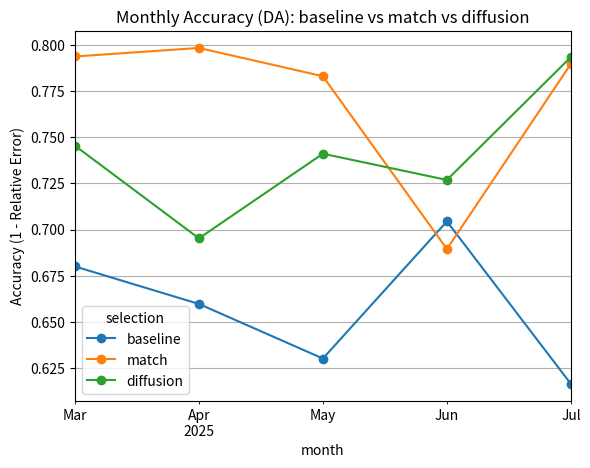

In [12]:
# >>> 新增(Diffusion)：DA 三方法（月度）准确率对比
pivot_DA_all = monthly[monthly["kind"] == "DA"] \
    .pivot(index="month", columns="selection", values="monthly_accuracy")

print("\n=== 月度准确率（DA，含 diffusion）===")
print(pivot_DA_all.round(4))

ax = pivot_DA_all[["baseline", "match", "diffusion"]].plot(
    marker="o", title="Monthly Accuracy (DA): baseline vs match vs diffusion"
)
ax.set_ylabel("Accuracy (1 - Relative Error)")
ax.grid(True)
plt.show()


# 每月回测D+n

Index(['price', '实时价格', '实时在线机组容量(MW)', '实时负荷率(%)', '非市场化机组出力-日内(MW)',
       '联络线计划-日内(MW)', '竞价空间-日内(MW)', '频率实际值(MW)', '实际上旋备用(MW)', '实际下旋备用(MW)',
       '省调负荷-日内(MW)', '新能源负荷-日内(MW)', '实时风电(MW)', '实时光伏(MW)', '水电出力值-日内(MW)',
       '日前在线机组容量(MW)', '日前负荷率(%)', '非市场化机组出力-日前(MW)', '联络线计划-日前(MW)',
       '竞价空间-日前(MW)', '省调负荷-日前(MW)', '新能源负荷-日前(MW)', '正备用-日前(MW)',
       '新能源负荷备用-日前(MW)', '日前光伏(MW)', '日前风电(MW)'],
      dtype='object')

===== D+2 =====
base_day ∈ [2025-03-01, 2025-07-29] ; target_day ∈ [2025-03-03, 2025-07-31]


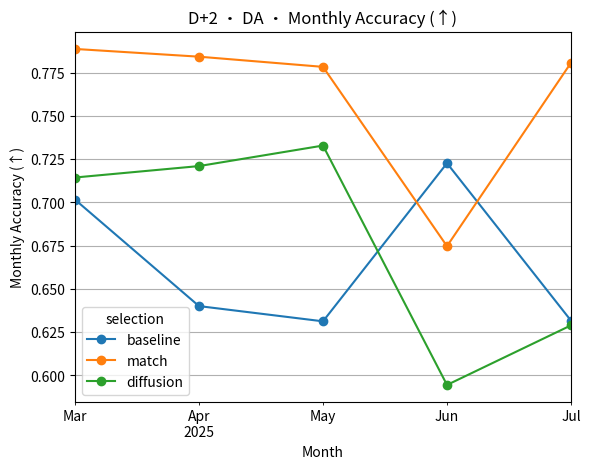

[D+2][DA] 月度对比（含 delta=match-baseline）:
selection   baseline   match  diffusion   delta
month                                          
2025-03-01    0.7017  0.7888     0.7144  0.0871
2025-04-01    0.6401  0.7843     0.7210  0.1442
2025-05-01    0.6313  0.7784     0.7329  0.1471
2025-06-01    0.7227  0.6748     0.5945 -0.0480
2025-07-01    0.6317  0.7808     0.6290  0.1491


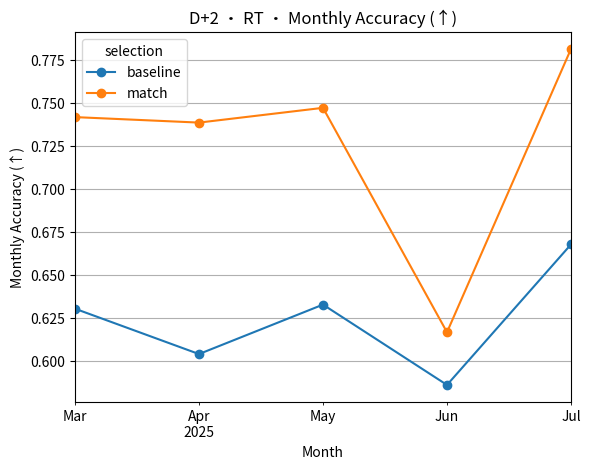

[D+2][RT] 月度对比（含 delta=match-baseline）:
selection   baseline   match   delta
month                               
2025-03-01    0.6305  0.7417  0.1113
2025-04-01    0.6041  0.7386  0.1344
2025-05-01    0.6329  0.7471  0.1143
2025-06-01    0.5862  0.6168  0.0306
2025-07-01    0.6678  0.7813  0.1135

===== D+3 =====
base_day ∈ [2025-03-01, 2025-07-28] ; target_day ∈ [2025-03-04, 2025-07-31]


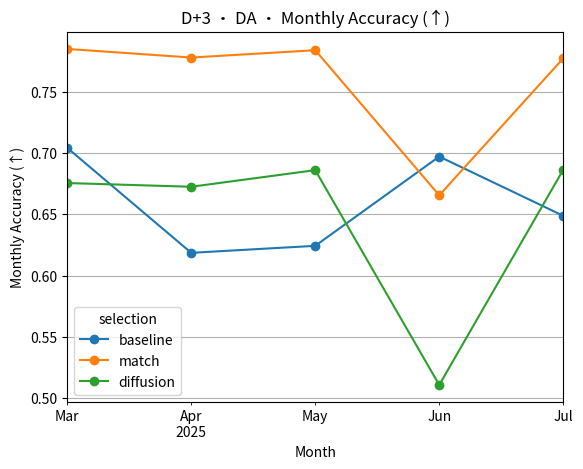

[D+3][DA] 月度对比（含 delta=match-baseline）:
selection   baseline   match  diffusion   delta
month                                          
2025-03-01    0.7043  0.7851     0.6755  0.0808
2025-04-01    0.6185  0.7780     0.6725  0.1595
2025-05-01    0.6243  0.7840     0.6861  0.1598
2025-06-01    0.6972  0.6655     0.5106 -0.0316
2025-07-01    0.6488  0.7774     0.6864  0.1286


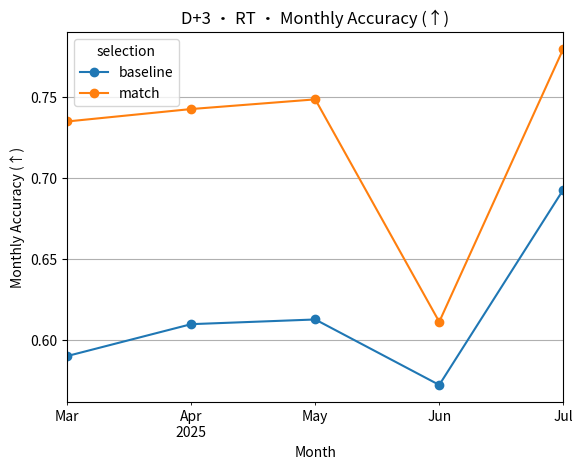

[D+3][RT] 月度对比（含 delta=match-baseline）:
selection   baseline   match   delta
month                               
2025-03-01    0.5904  0.7347  0.1443
2025-04-01    0.6100  0.7423  0.1324
2025-05-01    0.6129  0.7483  0.1354
2025-06-01    0.5726  0.6114  0.0388
2025-07-01    0.6927  0.7793  0.0866

===== D+4 =====
base_day ∈ [2025-03-01, 2025-07-27] ; target_day ∈ [2025-03-05, 2025-07-31]


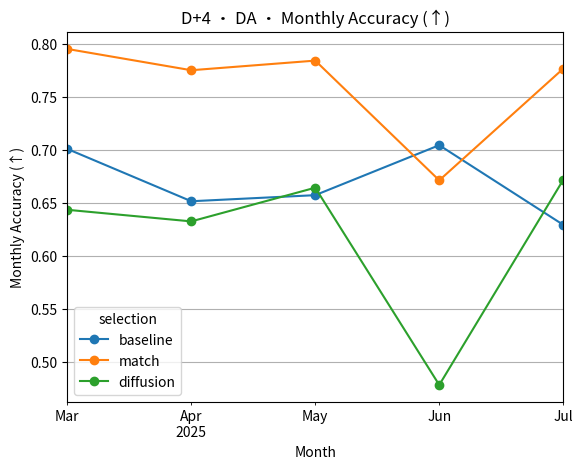

[D+4][DA] 月度对比（含 delta=match-baseline）:
selection   baseline   match  diffusion   delta
month                                          
2025-03-01    0.7007  0.7949     0.6433  0.0942
2025-04-01    0.6514  0.7749     0.6324  0.1235
2025-05-01    0.6571  0.7839     0.6641  0.1268
2025-06-01    0.7042  0.6711     0.4782 -0.0331
2025-07-01    0.6292  0.7764     0.6716  0.1472


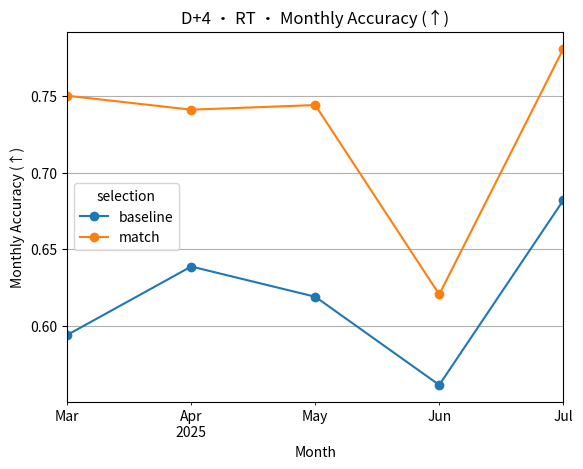

[D+4][RT] 月度对比（含 delta=match-baseline）:
selection   baseline   match   delta
month                               
2025-03-01    0.5942  0.7502  0.1560
2025-04-01    0.6388  0.7411  0.1023
2025-05-01    0.6191  0.7441  0.1250
2025-06-01    0.5616  0.6206  0.0590
2025-07-01    0.6819  0.7807  0.0988

===== D+5 =====
base_day ∈ [2025-03-01, 2025-07-26] ; target_day ∈ [2025-03-06, 2025-07-31]


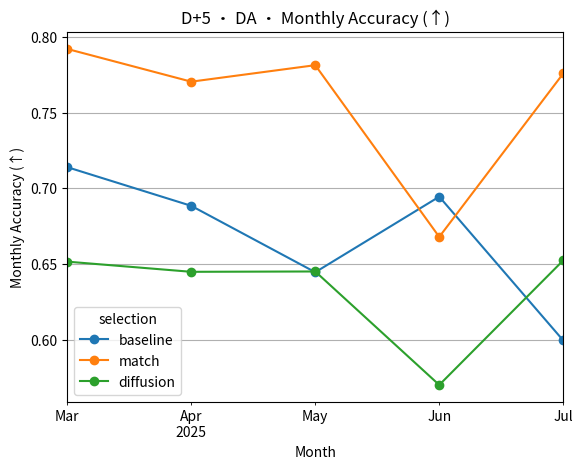

[D+5][DA] 月度对比（含 delta=match-baseline）:
selection   baseline   match  diffusion   delta
month                                          
2025-03-01    0.7140  0.7919     0.6517  0.0779
2025-04-01    0.6885  0.7703     0.6450  0.0818
2025-05-01    0.6447  0.7812     0.6452  0.1365
2025-06-01    0.6945  0.6680     0.5704 -0.0265
2025-07-01    0.5997  0.7757     0.6525  0.1760


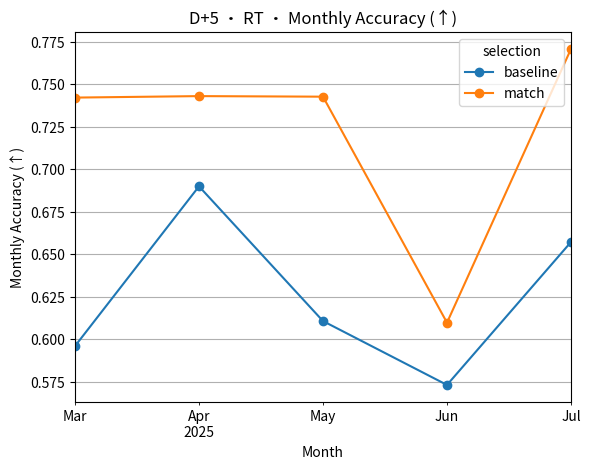

[D+5][RT] 月度对比（含 delta=match-baseline）:
selection   baseline   match   delta
month                               
2025-03-01    0.5960  0.7420  0.1461
2025-04-01    0.6899  0.7429  0.0530
2025-05-01    0.6107  0.7426  0.1319
2025-06-01    0.5732  0.6098  0.0366
2025-07-01    0.6572  0.7706  0.1135


In [13]:
# === D+n（n=2,3,4,5） -> 每月平均误差图（baseline vs match；DA/RT） ===
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append("../")  # 确保 utils 在路径中

from utils.RollingLoadratePrice_utils_V1 import (
    process_market_data,
    build_curves_record_with_history_classify_from_csv,
    load_pred_series_from_csv,  # 拿 Pred_Label 可用日
)

# ---------- 基础路径与参数 ----------
parquet_path = "../data/processed/shanxi_new.parquet"
pred_csv_path = "../save/curve_classify/multi_GRU_predict_results_V2.csv"
truth_csv_path = "../data/processed/hiking_01_dataset.csv"   # selection='match' 需要

date_begin = "2025-03-01"
date_end   = "2025-07-31"
d = 5  # 历史窗口天数

# 选择要画“误差”还是“准确率”
# - METRIC="rel_err"  -> 画 monthly_rel_err（越低越好）
# - METRIC="accuracy" -> 画 monthly_accuracy（越高越好）
METRIC = "accuracy"

# >>> 新增(Diffusion)：diffusion 结果目录（文件名规则：da_dist_{n}.csv；n=1 表示 D+1）
diffusion_dir = "../save/price_pred_da"

# ---------- 读数据 & 预处理 ----------
mdf_raw = pd.read_parquet(parquet_path, engine="fastparquet")
market_data = process_market_data(mdf_raw.copy(), date_begin=date_begin, date_end=date_end)

# 预测标签可用日（match 用得到）；market_data 可用日
pred_days  = load_pred_series_from_csv(pred_csv_path).index
avail_days = pd.to_datetime(market_data.index.normalize().unique())

def build_eval_window(H: int):
    """根据 horizon=H 计算 base_day 的评估区间（[lo, hi-H]），保证 target_day 存在。"""
    lo = max(pd.to_datetime(date_begin), pred_days.min() - pd.Timedelta(days=H), avail_days.min())
    hi = min(pd.to_datetime(date_end),   pred_days.max(),                           avail_days.max())
    date_begin_eval = lo.strftime("%Y-%m-%d")
    date_end_eval   = (hi - pd.Timedelta(days=H)).strftime("%Y-%m-%d")
    return date_begin_eval, date_end_eval, hi

def _safe_daily_metrics(curves_record: dict, kind: str) -> pd.DataFrame:
    """按天计算 MAE / 相对误差 / 准确率；kind in {'da','rt'}"""
    rows = []
    for dstr, c in curves_record.items():
        true = np.asarray(c["price_da"] if kind=="da" else c["price_rt"], dtype=float)
        pred_s = c["price_pred_da"] if kind=="da" else c["price_pred_rt"]
        pred = np.asarray(getattr(pred_s, "values", pred_s), dtype=float)

        n = min(len(true), len(pred))
        if n == 0:
            continue
        true = true[:n]; pred = pred[:n]
        mask = np.isfinite(true) & np.isfinite(pred)
        if not mask.any():
            continue

        mae = np.mean(np.abs(pred[mask] - true[mask]))
        mean_true = np.mean(true[mask])
        rel_err = np.nan if mean_true <= 1e-8 else (mae / mean_true)
        acc = np.nan if not np.isfinite(rel_err) else (1.0 - rel_err)

        rows.append({
            "date": pd.to_datetime(dstr),
            "kind": kind.upper(),    # 'DA' or 'RT'
            "mae": mae,
            "mean_true": mean_true,
            "rel_err": rel_err,
            "accuracy": acc,
            "n_points": int(mask.sum()),
        })
    return pd.DataFrame(rows).sort_values("date")

def eval_curves(curves_record: dict, selection_name: str) -> pd.DataFrame:
    df = pd.concat([
        _safe_daily_metrics(curves_record, "da"),
        _safe_daily_metrics(curves_record, "rt"),
    ], ignore_index=True)
    df["selection"] = selection_name  # 'baseline' or 'match'
    return df

def monthly_summary(df: pd.DataFrame) -> pd.DataFrame:
    out = df.copy()
    out["month"] = out["date"].dt.to_period("M").dt.to_timestamp()
    g = out.groupby(["month", "kind", "selection"], dropna=True)
    return g.agg(
        monthly_accuracy=("accuracy", "mean"),
        monthly_rel_err=("rel_err", "mean"),
        days=("date", "nunique")
    ).reset_index().sort_values(["month","kind","selection"])

# >>> 新增(Diffusion)：把 (真值 price, diffusion p50) 组装成 curves_record（仅 DA）
def build_curves_record_diffusion_da(truth_df: pd.DataFrame,
                                     dist_df: pd.DataFrame,
                                     date_begin_target: str,
                                     date_end_target: str) -> dict:
    """
    truth_df: 含 ['time','price'] 的真实 DA 价格
    dist_df:  含 ['time','p50'] 的 diffusion 预测（D+H 对应文件）
    只构建 DA：键包括 'price_da' 和 'price_pred_da'
    """
    df = (truth_df.merge(dist_df[["time", "p50"]], on="time", how="inner")
                  .sort_values("time"))
    lo = pd.to_datetime(date_begin_target)
    hi = pd.to_datetime(date_end_target) + pd.Timedelta(minutes=45)
    df = df[(df["time"] >= lo) & (df["time"] <= hi)].copy()
    df["date"] = df["time"].dt.date

    out = {}
    for d_, g in df.groupby("date"):
        out[pd.to_datetime(d_).strftime("%Y-%m-%d")] = {
            "price_da": g["price"].to_numpy(dtype=float),
            "price_pred_da": g["p50"].to_numpy(dtype=float),
        }
    return out

def run_dn_monthly(H: int):
    """构建 D+H 的 baseline/match，计算月度指标并画图（DA/RT 各一张）。"""
    date_begin_eval, date_end_eval, hi = build_eval_window(H)
    print(f"\n===== D+{H} =====")
    print(
        f"base_day ∈ [{date_begin_eval}, {date_end_eval}] ; "
        f"target_day ∈ [{(pd.to_datetime(date_begin_eval)+pd.Timedelta(days=H)).strftime('%Y-%m-%d')}, {hi.strftime('%Y-%m-%d')}]"
    )

    # baseline
    curves_baseline = build_curves_record_with_history_classify_from_csv(
        market_data=market_data,
        date_begin=date_begin_eval,
        date_end=date_end_eval,
        d=d,
        pred_csv_path=pred_csv_path,  # baseline 不用，但保留无妨
        truth_csv_path=None,
        selection="baseline",
        horizon=H,
    )
    # match
    curves_match = build_curves_record_with_history_classify_from_csv(
        market_data=market_data,
        date_begin=date_begin_eval,
        date_end=date_end_eval,
        d=d,
        pred_csv_path=pred_csv_path,   # match 需要目标日 Pred_Label
        truth_csv_path=truth_csv_path, # match 用真实标签筛历史同类日
        selection="match",
        horizon=H,
    )

    if len(curves_baseline)==0 and len(curves_match)==0:
        print(f"[D+{H}] 区间无可评估数据。")
        return

    # 日级 -> 月级
    daily_base  = eval_curves(curves_baseline, "baseline") if len(curves_baseline)>0 else pd.DataFrame()
    daily_match = eval_curves(curves_match,    "match")    if len(curves_match)>0    else pd.DataFrame()
    daily_all = pd.concat([daily_base, daily_match], ignore_index=True)

    # >>> 新增(Diffusion)：读取 da_dist_{H}.csv 并并入 DA 指标
    try:
        dist_path = f"{diffusion_dir}/da_dist_{H}.csv"
        dist_df = pd.read_csv(dist_path)
        dist_df["time"] = pd.to_datetime(dist_df["time"]).dt.tz_localize(None)

        # 准备 truth DA（含 time, price），方便拼接
        md_for_join = market_data.reset_index()
        if "index" in md_for_join.columns and "time" not in md_for_join.columns:
            md_for_join = md_for_join.rename(columns={"index": "time"})
        truth_da = md_for_join[["time", "price"]].copy()

        # diffusion 只评估“目标日”窗口：[date_begin_eval + H, hi]
        date_begin_target = (pd.to_datetime(date_begin_eval) + pd.Timedelta(days=H)).strftime("%Y-%m-%d")
        date_end_target   = hi.strftime("%Y-%m-%d")

        curves_diffusion = build_curves_record_diffusion_da(
            truth_da, dist_df, date_begin_target, date_end_target
        )
        if len(curves_diffusion) > 0:
            daily_diffusion = _safe_daily_metrics(curves_diffusion, "da")
            daily_diffusion["selection"] = "diffusion"
            daily_all = pd.concat([daily_all, daily_diffusion], ignore_index=True)
        else:
            print(f"[D+{H}] diffusion 在目标窗口无数据，跳过。")
    except FileNotFoundError:
        print(f"[D+{H}] 未找到 diffusion 文件：{dist_path}，跳过。")

    if daily_all.empty:
        print(f"[D+{H}] 无有效日级样本。")
        return

    monthly = monthly_summary(daily_all)

    # 选择要画的指标列名
    value_col = "monthly_rel_err" if METRIC == "rel_err" else "monthly_accuracy"
    ylabel = "Monthly Relative Error (↓)" if METRIC == "rel_err" else "Monthly Accuracy (↑)"

    # 两张图：DA / RT
    for kind in ["DA", "RT"]:
        sub = monthly[monthly["kind"] == kind]
        if sub.empty:
            print(f"[D+{H}][{kind}] 无月度样本。")
            continue
        pvt = sub.pivot(index="month", columns="selection", values=value_col)

        # 如果某类缺失，补列以便并排画
        for col in (["baseline", "match", "diffusion"] if kind=="DA" else ["baseline", "match"]):
            if col not in pvt.columns:
                pvt[col] = np.nan

        # >>> 新增(Diffusion)：DA 图同时画 baseline/match/diffusion；RT 仍然只有 baseline/match
        use_cols = ["baseline", "match", "diffusion"] if kind == "DA" else ["baseline", "match"]
        pvt = pvt[use_cols]

        ax = pvt.plot(marker="o", title=f"D+{H} • {kind} • {ylabel}")
        ax.set_ylabel(ylabel)
        ax.set_xlabel("Month")
        ax.grid(True)
        plt.show()

        # 也给出 delta（match - baseline），便于判断 match 是否相对更好（误差为负越好；准确率为正越好）
        # >>> 新增(Diffusion)：保留你原来的 delta 定义；如需和 diffusion 比较，也可另外计算
        if "baseline" in pvt.columns and "match" in pvt.columns:
            pvt["delta"] = pvt["match"] - pvt["baseline"]
        print(f"[D+{H}][{kind}] 月度对比（含 delta=match-baseline）:")
        print(pvt.round(4))

# 依次跑 D+2, D+3, D+4, D+5
for H in [2, 3, 4, 5]:
    run_dn_monthly(H)


Index(['price', '实时价格', '实时在线机组容量(MW)', '实时负荷率(%)', '非市场化机组出力-日内(MW)',
       '联络线计划-日内(MW)', '竞价空间-日内(MW)', '频率实际值(MW)', '实际上旋备用(MW)', '实际下旋备用(MW)',
       '省调负荷-日内(MW)', '新能源负荷-日内(MW)', '实时风电(MW)', '实时光伏(MW)', '水电出力值-日内(MW)',
       '日前在线机组容量(MW)', '日前负荷率(%)', '非市场化机组出力-日前(MW)', '联络线计划-日前(MW)',
       '竞价空间-日前(MW)', '省调负荷-日前(MW)', '新能源负荷-日前(MW)', '正备用-日前(MW)',
       '新能源负荷备用-日前(MW)', '日前光伏(MW)', '日前风电(MW)'],
      dtype='object')

===== D+2 • baseline =====
base_day ∈ [2025-07-19, 2025-08-03] ; target_day ∈ [2025-07-21, 2025-08-05]


[D+2][baseline] 天数：14


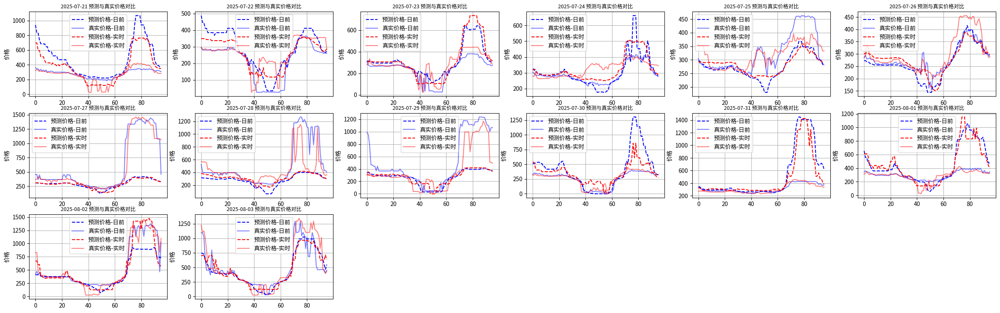

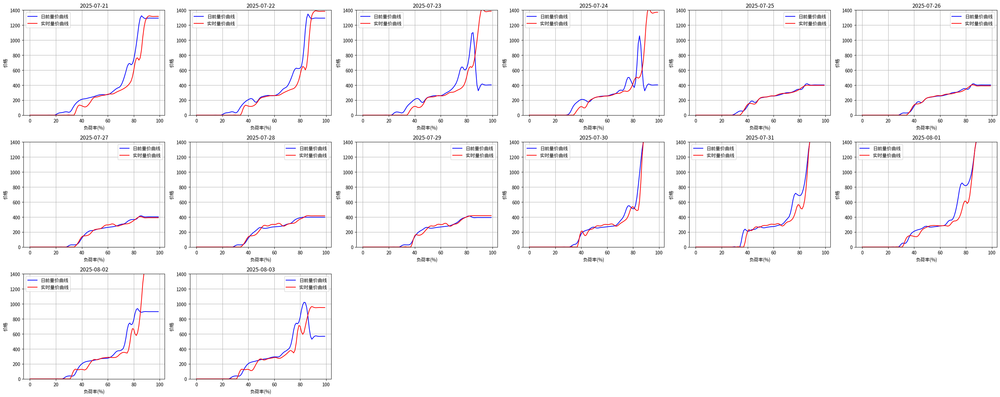


===== D+2 • match =====
base_day ∈ [2025-07-19, 2025-08-03] ; target_day ∈ [2025-07-21, 2025-08-05]
[D+2][match] 天数：14


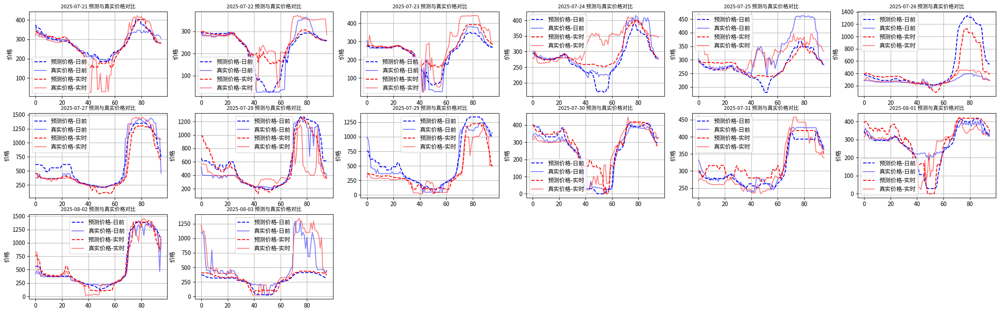

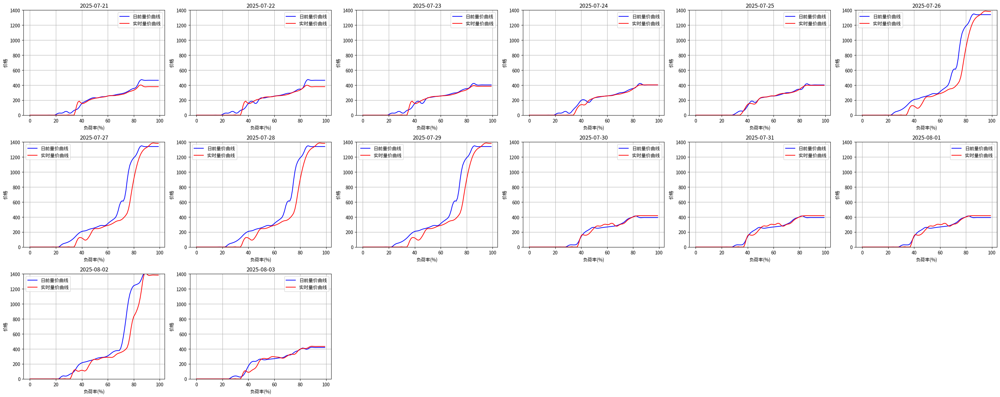


===== D+3 • baseline =====
base_day ∈ [2025-07-18, 2025-08-02] ; target_day ∈ [2025-07-21, 2025-08-05]
[D+3][baseline] 天数：13


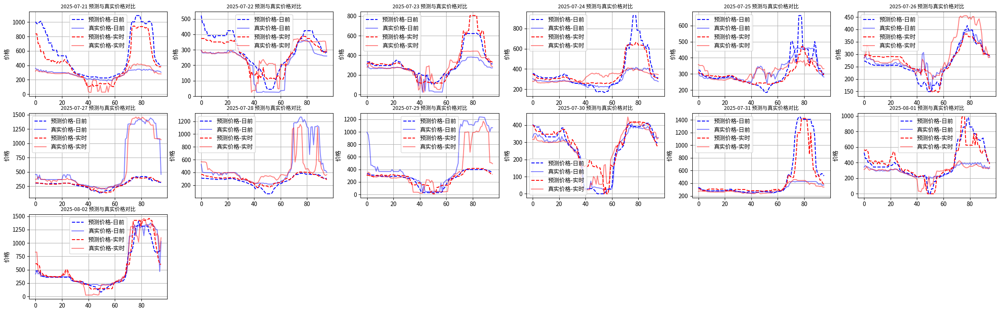

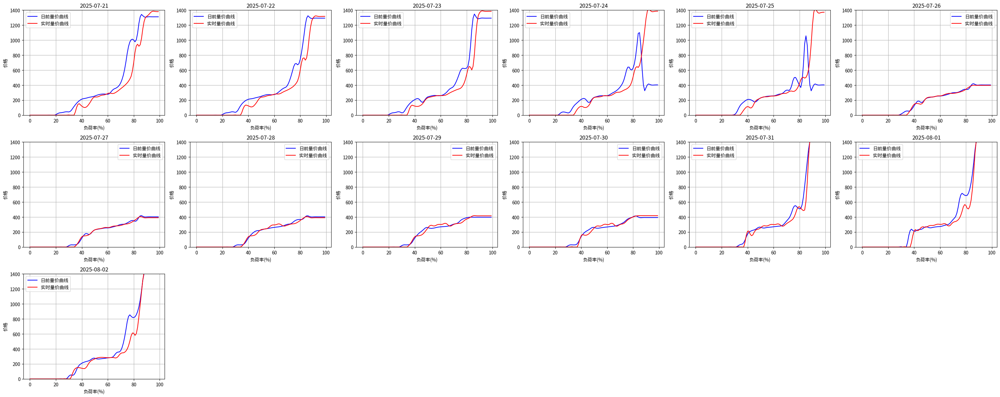


===== D+3 • match =====
base_day ∈ [2025-07-18, 2025-08-02] ; target_day ∈ [2025-07-21, 2025-08-05]
[D+3][match] 天数：13


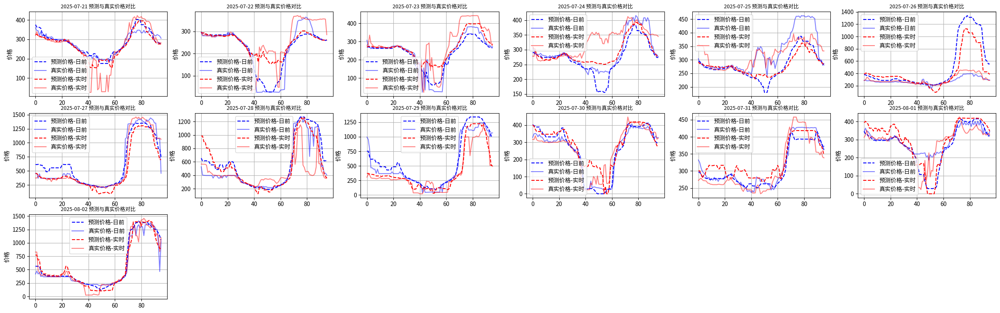

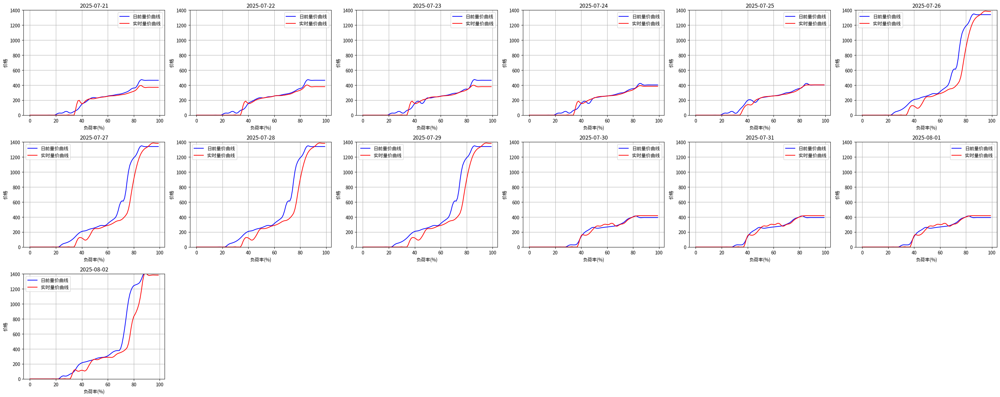


===== D+4 • baseline =====
base_day ∈ [2025-07-17, 2025-08-01] ; target_day ∈ [2025-07-21, 2025-08-05]
[D+4][baseline] 天数：12


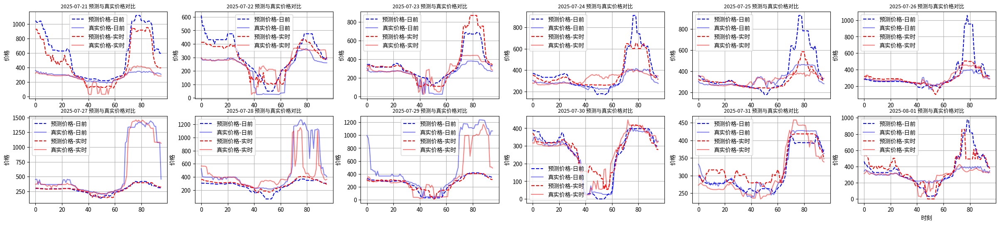

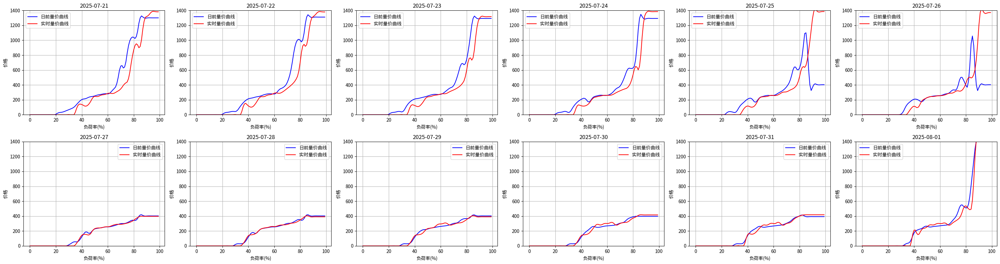


===== D+4 • match =====
base_day ∈ [2025-07-17, 2025-08-01] ; target_day ∈ [2025-07-21, 2025-08-05]
[D+4][match] 天数：12


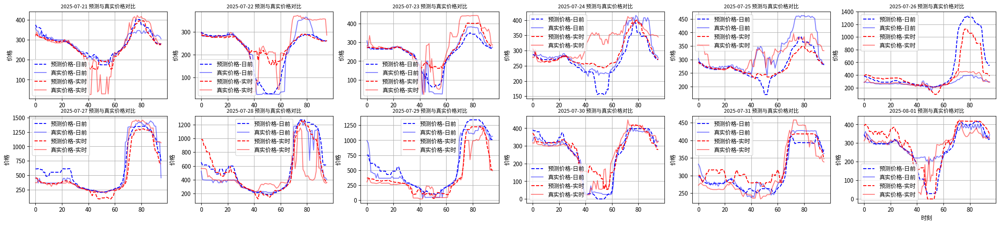

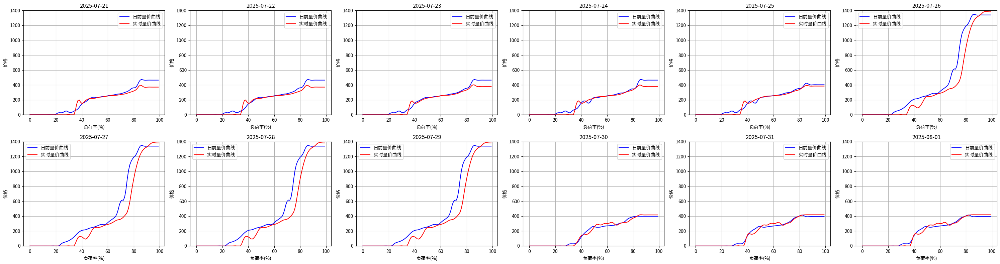


===== D+5 • baseline =====
base_day ∈ [2025-07-16, 2025-07-31] ; target_day ∈ [2025-07-21, 2025-08-05]
[D+5][baseline] 天数：11


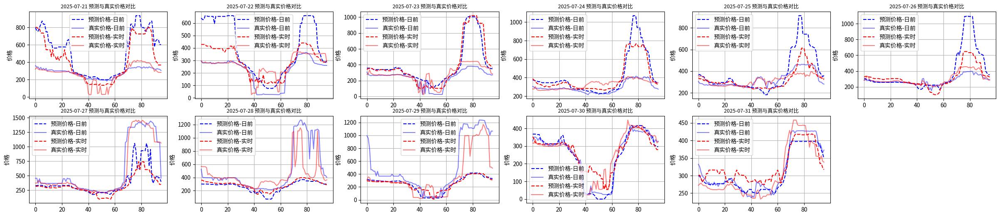

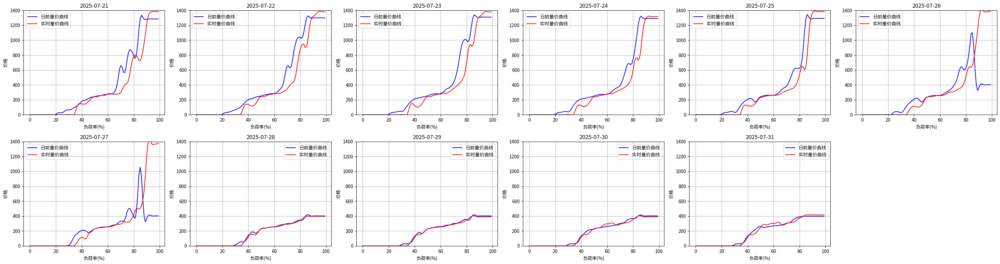


===== D+5 • match =====
base_day ∈ [2025-07-16, 2025-07-31] ; target_day ∈ [2025-07-21, 2025-08-05]
[D+5][match] 天数：11


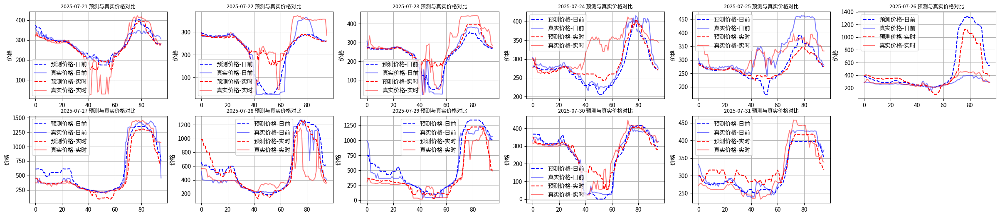

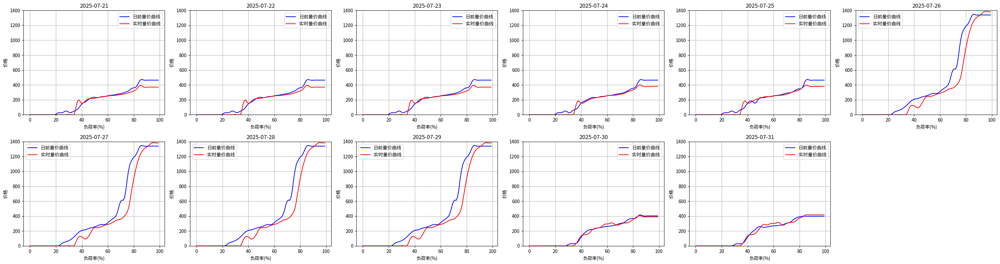

In [ ]:
# === D+n（n=2,3,4,5）构造并画图 ===
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append("../")  # 确保 utils 在路径中

from utils.RollingLoadratePrice_utils_V1 import (
    process_market_data,
    build_curves_record_with_history_classify_from_csv,
    load_pred_series_from_csv,
    plot_compare_predict_vs_true,
    plot_loadrate_price_curves,
)

# ---------- 基础路径与参数 ----------
parquet_path = "../data/processed/shanxi_new.parquet"
pred_csv_path = "../save/curve_classify/multi_GRU_predict_results_V2.csv"
truth_csv_path = "../data/processed/hiking_01_dataset.csv"   # selection='match' 需要

date_begin = "2025-01-01"
date_end   = "2025-08-25"

# 只想画的“目标日”范围
TARGET_BEGIN = "2025-07-21"
TARGET_END   = "2025-08-25"

d = 5  # 历史窗口天数

# ---------- 读数据 & 预处理 ----------
mdf_raw = pd.read_parquet(parquet_path, engine="fastparquet")
market_data = process_market_data(mdf_raw.copy(), date_begin=date_begin, date_end=date_end)

# 预测标签可用日（match 用得到）；market_data 可用日
pred_days  = load_pred_series_from_csv(pred_csv_path).index
avail_days = pd.to_datetime(market_data.index.normalize().unique())

def build_eval_window_baseline(H: int):
    """
    baseline 不需要 Pred_Label。
    目标日可用范围 = market_data 可用范围 ∩ [TARGET_BEGIN, TARGET_END]
    base_day = target_day - H
    """
    t_lo = max(pd.to_datetime(TARGET_BEGIN), avail_days.min())
    t_hi = min(pd.to_datetime(TARGET_END),   avail_days.max())
    date_begin_eval = (t_lo - pd.Timedelta(days=H)).strftime("%Y-%m-%d")
    date_end_eval   = (t_hi - pd.Timedelta(days=H)).strftime("%Y-%m-%d")
    return date_begin_eval, date_end_eval, t_lo, t_hi

def build_eval_window_match(H: int):
    """
    match 需要目标日的 Pred_Label。
    目标日可用范围 = market_data 可用范围 ∩ Pred_Label 可用范围 ∩ [TARGET_BEGIN, TARGET_END]
    base_day = target_day - H
    """
    t_lo = max(pd.to_datetime(TARGET_BEGIN), avail_days.min(), pred_days.min())
    t_hi = min(pd.to_datetime(TARGET_END),   avail_days.max(), pred_days.max())
    date_begin_eval = (t_lo - pd.Timedelta(days=H)).strftime("%Y-%m-%d")
    date_end_eval   = (t_hi - pd.Timedelta(days=H)).strftime("%Y-%m-%d")
    return date_begin_eval, date_end_eval, t_lo, t_hi

def run_once(H: int):
    """构造并画出给定 D+H 的两套图：baseline / match（仅目标日 7/21~8/05）。"""
    # baseline 的 base_day 窗口
    base_lo_b, base_hi_b, t_lo_b, t_hi_b = build_eval_window_baseline(H)
    print(f"\n===== D+{H} • baseline =====")
    print(f"base_day ∈ [{base_lo_b}, {base_hi_b}] ; target_day ∈ [{t_lo_b.strftime('%Y-%m-%d')}, {t_hi_b.strftime('%Y-%m-%d')}]")

    curves_baseline = build_curves_record_with_history_classify_from_csv(
        market_data=market_data,
        date_begin=base_lo_b,
        date_end=base_hi_b,
        d=d,
        pred_csv_path=pred_csv_path,   # baseline 不用，保留无妨
        truth_csv_path=None,
        selection="baseline",
        horizon=H,
    )
    if len(curves_baseline) == 0:
        print(f"[D+{H}][baseline] 没有可画的数据。")
    else:
        print(f"[D+{H}][baseline] 天数：{len(curves_baseline)}")
        plot_compare_predict_vs_true(curves_baseline)
        plot_loadrate_price_curves(curves_baseline)

    # match 的 base_day 窗口（需要目标日有 Pred_Label）
    base_lo_m, base_hi_m, t_lo_m, t_hi_m = build_eval_window_match(H)
    print(f"\n===== D+{H} • match =====")
    print(f"base_day ∈ [{base_lo_m}, {base_hi_m}] ; target_day ∈ [{t_lo_m.strftime('%Y-%m-%d')}, {t_hi_m.strftime('%Y-%m-%d')}]")

    curves_match = build_curves_record_with_history_classify_from_csv(
        market_data=market_data,
        date_begin=base_lo_m,
        date_end=base_hi_m,
        d=d,
        pred_csv_path=pred_csv_path,
        truth_csv_path=truth_csv_path,
        selection="match",
        horizon=H,
    )
    if len(curves_match) == 0:
        print(f"[D+{H}][match] 没有可画的数据（检查目标日 Pred_Label 是否存在）。")
    else:
        print(f"[D+{H}][match] 天数：{len(curves_match)}")
        plot_compare_predict_vs_true(curves_match)
        plot_loadrate_price_curves(curves_match)


# 依次跑 D+2, D+3, D+4, D+5
for H in [2, 3, 4, 5]:
    run_once(H)



In [6]:
# === D+n（n=2,3,4,5）—— 输出每个目标日 24 个整点的 DA 数据（baseline / match） ===
import os
import sys
import numpy as np
import pandas as pd

sys.path.append("../")  # 确保 utils 在路径中
from utils.RollingLoadratePrice_utils_V1 import (
    process_market_data,
    build_curves_record_with_history_classify_from_csv,
    load_pred_series_from_csv,
    # 下面两个仅用于原脚本画图，这里不使用；保留 import 不影响
    # plot_compare_predict_vs_true,
    # plot_loadrate_price_curves,
)

# ---------- 基础路径与参数 ----------
parquet_path   = "../data/processed/shanxi_new.parquet"
pred_csv_path  = "../save/curve_classify/multi_GRU_predict_results_V3.csv"
truth_csv_path = "../data/processed/hiking_01_dataset.csv"   # selection='match' 需要

date_begin = "2025-01-01"
date_end   = "2025-08-25"

# 只想导出的“目标日”范围（target_day）
TARGET_BEGIN = "2025-03-01"
TARGET_END   = "2025-08-25"

d = 5  # 历史窗口天数
OUT_DIR = "../save/da_curves"  # 输出目录（每个 H 一份 CSV）
os.makedirs(OUT_DIR, exist_ok=True)

# ---------- 读数据 & 预处理 ----------
mdf_raw = pd.read_parquet(parquet_path, engine="fastparquet")
market_data = process_market_data(mdf_raw.copy(), date_begin=date_begin, date_end=date_end)

# 预测标签可用日（match 用得到）；market_data 可用日
pred_days  = load_pred_series_from_csv(pred_csv_path).index              # DatetimeIndex（按天）
avail_days = pd.to_datetime(market_data.index.normalize().unique())      # DatetimeIndex（按天）

def build_eval_window_baseline(H: int):
    """
    baseline 不需要 Pred_Label。
    目标日可用范围 = market_data 可用范围 ∩ [TARGET_BEGIN, TARGET_END]
    base_day = target_day - H
    """
    t_lo = max(pd.to_datetime(TARGET_BEGIN), avail_days.min())
    t_hi = min(pd.to_datetime(TARGET_END),   avail_days.max())
    date_begin_eval = (t_lo - pd.Timedelta(days=H)).strftime("%Y-%m-%d")
    date_end_eval   = (t_hi - pd.Timedelta(days=H)).strftime("%Y-%m-%d")
    return date_begin_eval, date_end_eval, t_lo, t_hi

def build_eval_window_match(H: int):
    """
    match 需要目标日的 Pred_Label。
    目标日可用范围 = market_data 可用范围 ∩ Pred_Label 可用范围 ∩ [TARGET_BEGIN, TARGET_END]
    base_day = target_day - H
    """
    t_lo = max(pd.to_datetime(TARGET_BEGIN), avail_days.min(), pred_days.min())
    t_hi = min(pd.to_datetime(TARGET_END),   avail_days.max(), pred_days.max())
    date_begin_eval = (t_lo - pd.Timedelta(days=H)).strftime("%Y-%m-%d")
    date_end_eval   = (t_hi - pd.Timedelta(days=H)).strftime("%Y-%m-%d")
    return date_begin_eval, date_end_eval, t_lo, t_hi

def _curves_to_da_timeseries(curves_record: dict, method: str, H: int) -> pd.DataFrame:
    """
    将 curves_record(DA) 展开为 **target_day** 的 15min 时序表。
    输出列: ['horizon','method','date','time','true','pred']
    """
    rows = []
    for dstr, c in curves_record.items():
        base   = pd.Timestamp(dstr)                 # base_day
        target = base + pd.Timedelta(days=H)        # target_day
        true = np.asarray(c["price_da"], dtype=float)
        pred_s = c["price_pred_da"]
        pred = np.asarray(getattr(pred_s, "values", pred_s), dtype=float)
        n = min(len(true), len(pred))
        for i in range(n):
            rows.append({
                "horizon": H,
                "method": method,                   # 'baseline' / 'match'
                "date": target.date(),              # 对齐到 target_day（不是 base_day）
                "time": target + pd.Timedelta(minutes=15*i),
                "true": float(true[i]),
                "pred": float(pred[i]),
            })
    return pd.DataFrame(rows)

def _to_hourly_24(ts_15min: pd.DataFrame) -> pd.DataFrame:
    """
    把 15min 数据聚合为目标日 24 个整点（每小时平均）。
    输入列需包含: ['horizon','method','date','time','true','pred']
    返回同列；每个 (horizon, method, date) 恰好 24 行（00:00..23:00）。
    """
    ts_15min = ts_15min.copy()
    ts_15min["time"] = pd.to_datetime(ts_15min["time"])

    out = []
    for (H, mth, dte), g in ts_15min.groupby(["horizon", "method", "date"], dropna=False):
        day_start = pd.Timestamp(dte)
        hours = pd.date_range(day_start, periods=24, freq="1h")  # 24 个整点
        gh = (g.set_index("time")[["true", "pred"]]
                .resample("1h").mean()                           # 每小时均值
                .reindex(hours))                                  # 保证 24 行
        gh = gh.reset_index().rename(columns={"index": "time"})
        gh["horizon"] = H
        gh["method"]  = mth
        gh["date"]    = pd.to_datetime(dte)
        out.append(gh[["horizon","method","date","time","true","pred"]])
    return pd.concat(out, ignore_index=True) if out else pd.DataFrame(
        columns=["horizon","method","date","time","true","pred"]
    )

def run_once(H: int):
    """构造给定 D+H 的 baseline / match，导出每个目标日 24 个整点的 DA 数据（不画图）。"""
    # baseline 的 base_day 窗口
    base_lo_b, base_hi_b, t_lo_b, t_hi_b = build_eval_window_baseline(H)
    print(f"\n===== D+{H} • baseline =====")
    print(f"base_day ∈ [{base_lo_b}, {base_hi_b}] ; target_day ∈ [{t_lo_b:%Y-%m-%d}, {t_hi_b:%Y-%m-%d}]")

    curves_baseline = build_curves_record_with_history_classify_from_csv(
        market_data=market_data,
        date_begin=base_lo_b,
        date_end=base_hi_b,
        d=d,
        pred_csv_path=pred_csv_path,   # baseline 不用，保留无妨
        truth_csv_path=None,
        selection="baseline",
        horizon=H,
    )
    if len(curves_baseline) == 0:
        print(f"[D+{H}][baseline] 无数据。")

    # match 的 base_day 窗口（需要目标日有 Pred_Label）
    base_lo_m, base_hi_m, t_lo_m, t_hi_m = build_eval_window_match(H)
    print(f"\n===== D+{H} • match =====")
    print(f"base_day ∈ [{base_lo_m}, {base_hi_m}] ; target_day ∈ [{t_lo_m:%Y-%m-%d}, {t_hi_m:%Y-%m-%d}]")

    curves_match = build_curves_record_with_history_classify_from_csv(
        market_data=market_data,
        date_begin=base_lo_m,
        date_end=base_hi_m,
        d=d,
        pred_csv_path=pred_csv_path,
        truth_csv_path=truth_csv_path,
        selection="match",
        horizon=H,
    )
    if len(curves_match) == 0:
        print(f"[D+{H}][match] 无数据（检查目标日 Pred_Label 是否存在）。")

    # 组装 15min → 转 24 点 → 导出
    parts = []
    if len(curves_baseline) > 0:
        parts.append(_curves_to_da_timeseries(curves_baseline, "baseline", H))
    if len(curves_match) > 0:
        parts.append(_curves_to_da_timeseries(curves_match, "match", H))

    if parts:
        ts_15min  = pd.concat(parts, ignore_index=True).sort_values(["date", "time", "method"])
        hourly_24 = _to_hourly_24(ts_15min)
        out_path  = f"{OUT_DIR}/DA_curves_Dplus{H}_hourly.csv"
        hourly_24.to_csv(out_path, index=False)
        print(f"[D+{H}] 已保存：{out_path}")
    else:
        print(f"[D+{H}] 无可保存的 DA 曲线数据。")

# 依次跑 D+2, D+3, D+4, D+5
for H in [2, 3, 4, 5]:
    run_once(H)


Index(['price', '实时价格', '实时在线机组容量(MW)', '实时负荷率(%)', '非市场化机组出力-日内(MW)',
       '联络线计划-日内(MW)', '竞价空间-日内(MW)', '频率实际值(MW)', '实际上旋备用(MW)', '实际下旋备用(MW)',
       '省调负荷-日内(MW)', '新能源负荷-日内(MW)', '实时风电(MW)', '实时光伏(MW)', '水电出力值-日内(MW)',
       '日前在线机组容量(MW)', '日前负荷率(%)', '非市场化机组出力-日前(MW)', '联络线计划-日前(MW)',
       '竞价空间-日前(MW)', '省调负荷-日前(MW)', '新能源负荷-日前(MW)', '正备用-日前(MW)',
       '新能源负荷备用-日前(MW)', '日前光伏(MW)', '日前风电(MW)'],
      dtype='object')

===== D+2 • baseline =====
base_day ∈ [2025-02-27, 2025-08-23] ; target_day ∈ [2025-03-01, 2025-08-25]

===== D+2 • match =====
base_day ∈ [2025-02-27, 2025-08-23] ; target_day ∈ [2025-03-01, 2025-08-25]
[D+2] 已保存：../save/da_curves/DA_curves_Dplus2_hourly.csv

===== D+3 • baseline =====
base_day ∈ [2025-02-26, 2025-08-22] ; target_day ∈ [2025-03-01, 2025-08-25]

===== D+3 • match =====
base_day ∈ [2025-02-26, 2025-08-22] ; target_day ∈ [2025-03-01, 2025-08-25]
[D+3] 已保存：../save/da_curves/DA_curves_Dplus3_hourly.csv

===== D+4 • baseline =====
base_day ∈ [2